In [1]:
from importlib.metadata import version
import cv2
import pixellib
import os
import matplotlib.pyplot as plt
from pixellib.semantic import semantic_segmentation
import numpy as np
import urllib

print(cv2.__version__)
print(version('pixellib'))

4.5.3
0.7.1


(300, 400, 3)


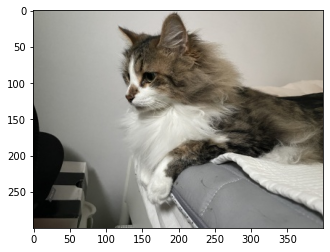

In [2]:
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/IMG_0675.JPG'  
img_orig = cv2.imread(img_path)  
img_orig = cv2.resize(img_orig, (400, 300), interpolation = cv2.INTER_AREA)
# 사이즈 변경
cv2.imwrite(img_path,img_orig)  # 사이즈 변경 후 img path에 저장 
print(img_orig.shape)
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

In [3]:
model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models' 
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5') 
model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5' 
urllib.request.urlretrieve(model_url, model_file)

('/aiffel/aiffel/human_segmentation/models/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5',
 <http.client.HTTPMessage at 0x7f2ed0683880>)

In [4]:
model = semantic_segmentation()
model.load_pascalvoc_model(model_file)

In [5]:
segvalues, output = model.segmentAsPascalvoc(img_path) 

In [6]:
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
len(LABEL_NAMES)

21

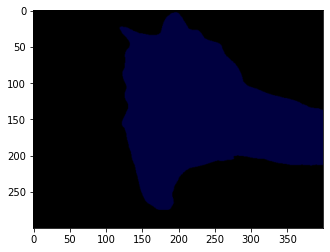

In [7]:
plt.imshow(output)
plt.show()

In [8]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
cat


In [9]:
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[8] 

array([64,  0,  0])

(300, 400)


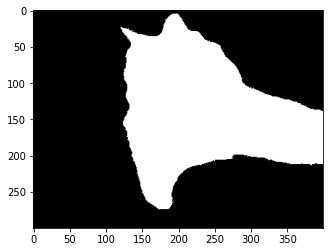

In [10]:
seg_color = (0,0, 64)
seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape) 
plt.imshow(seg_map, cmap='gray')
plt.show()

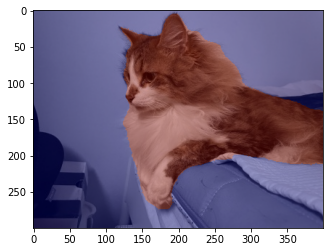

In [11]:
img_show = img_orig.copy()

img_mask = seg_map.astype(np.uint8) * 255
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

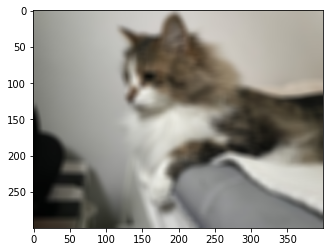

In [12]:
img_orig_blur = cv2.blur(img_orig, (10,10))
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

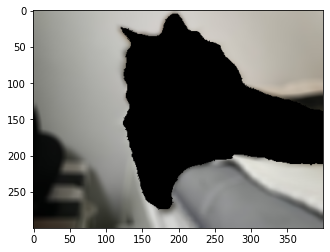

In [13]:
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
img_bg_mask = cv2.bitwise_not(img_mask_color)
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

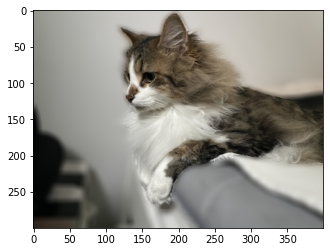

In [14]:
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

- 인식 못한 부분.

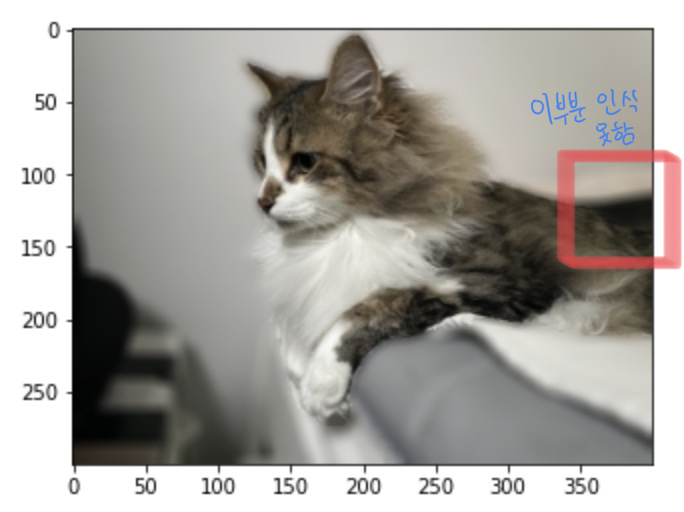

(300, 400, 3)


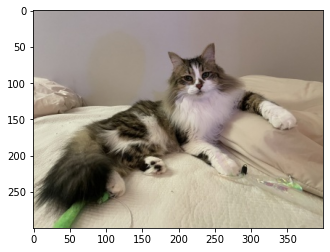

In [15]:
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/IMG_1248.JPG'  
img_orig = cv2.imread(img_path)  
img_orig = cv2.resize(img_orig, (400, 300), interpolation = cv2.INTER_AREA)
# 사이즈 변경
cv2.imwrite(img_path,img_orig)  # 사이즈 변경 후 img path에 저장 
print(img_orig.shape)
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

In [16]:
model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models' 
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5') 
model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5' 
urllib.request.urlretrieve(model_url, model_file)

('/aiffel/aiffel/human_segmentation/models/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5',
 <http.client.HTTPMessage at 0x7f2ea7774970>)

In [17]:
model = semantic_segmentation()
model.load_pascalvoc_model(model_file)

In [18]:
segvalues, output = model.segmentAsPascalvoc(img_path) 

In [19]:
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
len(LABEL_NAMES)

21

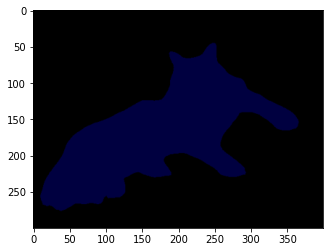

In [20]:
plt.imshow(output)
plt.show()

In [21]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
cat


In [22]:
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[8] 

array([64,  0,  0])

(300, 400)


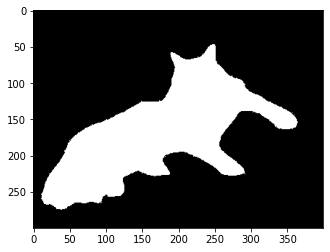

In [23]:
seg_color = (0,0, 64)
seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape) 
plt.imshow(seg_map, cmap='gray')
plt.show()

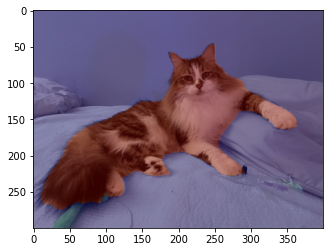

In [24]:
img_show = img_orig.copy()

img_mask = seg_map.astype(np.uint8) * 255
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

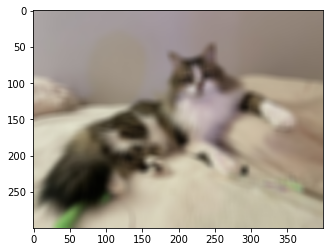

In [25]:
img_orig_blur = cv2.blur(img_orig, (10,10))
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

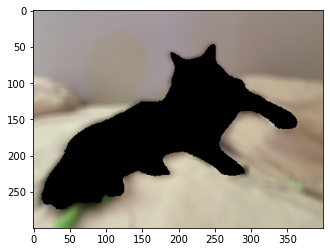

In [26]:
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
img_bg_mask = cv2.bitwise_not(img_mask_color)
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

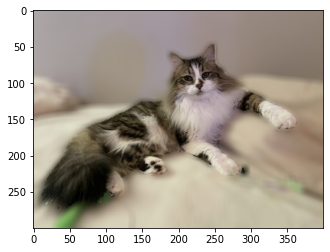

In [27]:
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

(300, 400, 3)


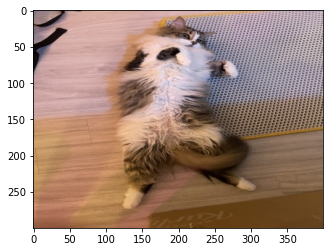

In [28]:
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/IMG_9557.JPG'  
img_orig = cv2.imread(img_path)  
img_orig = cv2.resize(img_orig, (400, 300), interpolation = cv2.INTER_AREA)
# 사이즈 변경
cv2.imwrite(img_path,img_orig)  # 사이즈 변경 후 img path에 저장 
print(img_orig.shape)
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

In [29]:
model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models' 
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5') 
model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5' 
urllib.request.urlretrieve(model_url, model_file)

('/aiffel/aiffel/human_segmentation/models/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5',
 <http.client.HTTPMessage at 0x7f2ea4b47940>)

In [30]:
model = semantic_segmentation()
model.load_pascalvoc_model(model_file)

In [31]:
segvalues, output = model.segmentAsPascalvoc(img_path) 

In [32]:
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
len(LABEL_NAMES)

21

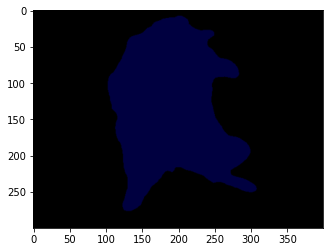

In [33]:
plt.imshow(output)
plt.show()

In [34]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
cat


In [35]:
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[8] 

array([64,  0,  0])

(300, 400)


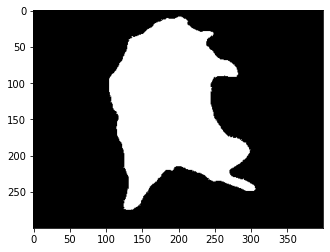

In [36]:
seg_color = (0,0, 64)
seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape) 
plt.imshow(seg_map, cmap='gray')
plt.show()

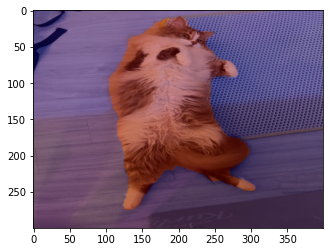

In [37]:
img_show = img_orig.copy()

img_mask = seg_map.astype(np.uint8) * 255
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

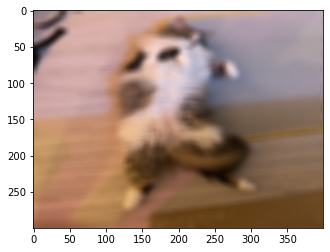

In [38]:
img_orig_blur = cv2.blur(img_orig, (10,10))
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

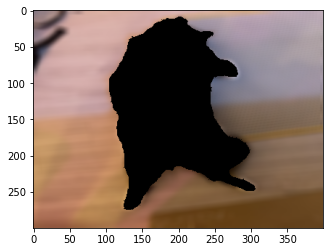

In [39]:
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
img_bg_mask = cv2.bitwise_not(img_mask_color)
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

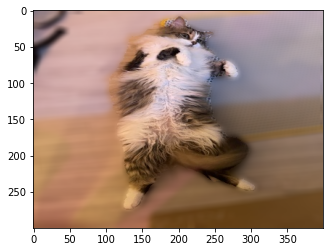

In [40]:
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

- 나머지 두 고양이는 인식을 잘했다.

### 사람과 고양이를 동시에 배경 흐리게 하기

(300, 400, 3)


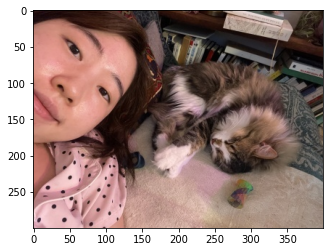

In [41]:
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/IMG_9642.JPG'  
img_orig = cv2.imread(img_path)  
img_orig = cv2.resize(img_orig, (400, 300), interpolation = cv2.INTER_AREA)
# 사이즈 변경
cv2.imwrite(img_path,img_orig)  # 사이즈 변경 후 img path에 저장 
print(img_orig.shape)
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

In [42]:
model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models' 
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5') 
model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5' 
urllib.request.urlretrieve(model_url, model_file)

('/aiffel/aiffel/human_segmentation/models/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5',
 <http.client.HTTPMessage at 0x7f2ed0056730>)

In [43]:
model = semantic_segmentation()
model.load_pascalvoc_model(model_file)

In [44]:
segvalues, output = model.segmentAsPascalvoc(img_path) 

In [45]:
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
len(LABEL_NAMES)

21

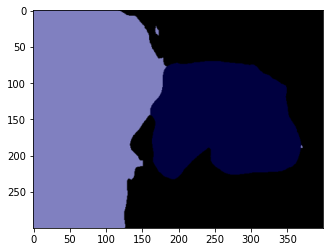

In [46]:
plt.imshow(output)
plt.show()

In [47]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
cat
person


In [48]:
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[8] 

array([64,  0,  0])

(300, 400)


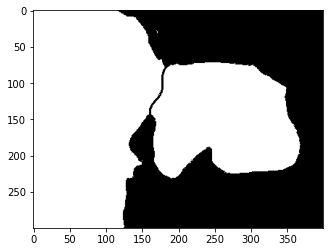

In [49]:
seg_color1 = (0, 0, 64)
seg_color2 = (128, 128, 192)
seg_map1 = np.all(output==seg_color1, axis=-1)
seg_map2 = np.all(output==seg_color2, axis=-1)
img_mask1 = seg_map1.astype(np.uint8) * 255
img_mask2 = seg_map2.astype(np.uint8) * 255

img_or_mask = cv2.bitwise_or(img_mask1, img_mask2)
print(seg_map.shape) 
plt.imshow(cv2.cvtColor(img_or_mask, cv2.COLOR_BGR2RGB))

plt.show()

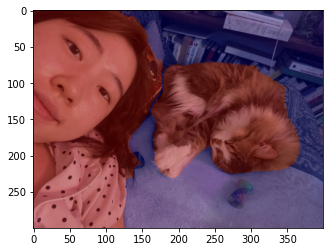

In [50]:
img_show = img_orig.copy()
color_mask = cv2.applyColorMap(img_or_mask , cv2.COLORMAP_JET)
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)
plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

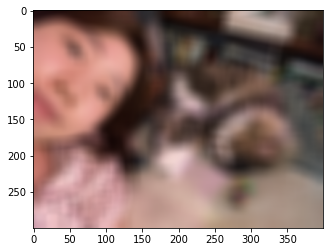

In [51]:
img_orig_blur = cv2.blur(img_orig, (20,20))
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

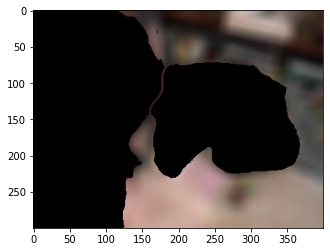

In [52]:
img_mask_color = cv2.cvtColor(img_or_mask, cv2.COLOR_GRAY2BGR)
img_bg_mask = cv2.bitwise_not(img_mask_color)
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

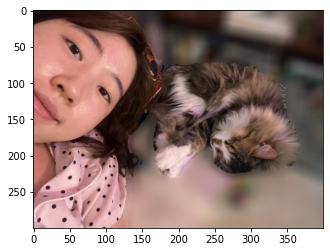

In [53]:
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

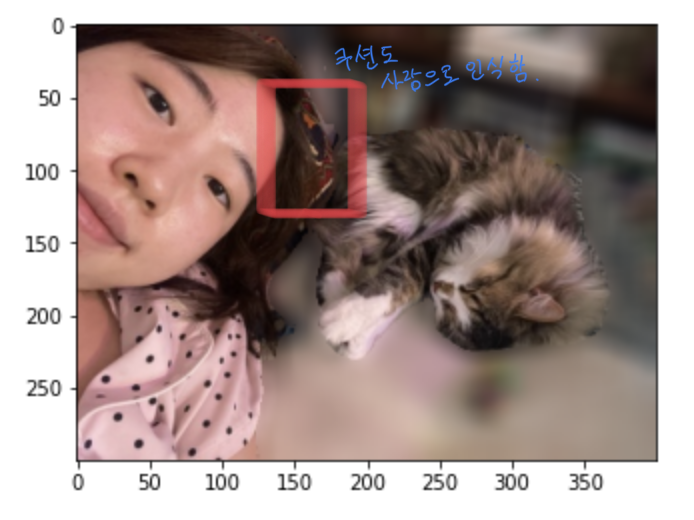

## 강아지 사진

(300, 300, 3)


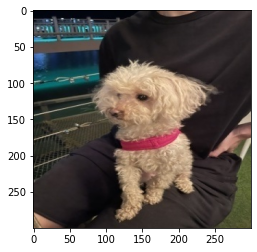

In [54]:
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/IMG_1142.JPG'  
img_orig = cv2.imread(img_path) 
img_orig = cv2.resize(img_orig, (300, 300), interpolation = cv2.INTER_AREA)
# 이미지 사이즈 변경
print(img_orig.shape)
cv2.imwrite(img_path,img_orig) # 사이즈 변경 후 img path에 저장 
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

In [55]:
model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models' 
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5') 
model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5' 
urllib.request.urlretrieve(model_url, model_file)

('/aiffel/aiffel/human_segmentation/models/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5',
 <http.client.HTTPMessage at 0x7f2eb14af460>)

In [56]:
model = semantic_segmentation()
model.load_pascalvoc_model(model_file)

In [57]:
segvalues, output = model.segmentAsPascalvoc(img_path) 

In [58]:
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
len(LABEL_NAMES)

21

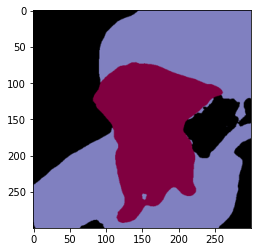

In [59]:
plt.imshow(output)
plt.show()

In [60]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
dog
person


In [61]:
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[12] 

array([ 64,   0, 128])

(300, 300)


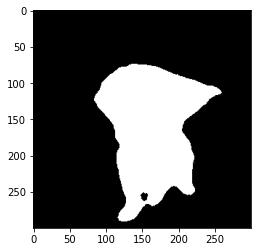

In [62]:
seg_color = (128,0, 64)
seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape) 
plt.imshow(seg_map, cmap='gray')
plt.show()

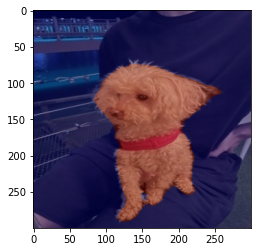

In [63]:
img_show = img_orig.copy()

img_mask = seg_map.astype(np.uint8) * 255
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

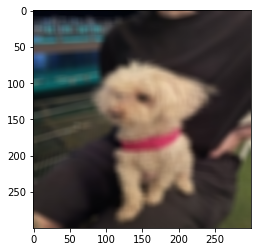

In [64]:
img_orig_blur = cv2.blur(img_orig, (10,10))
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

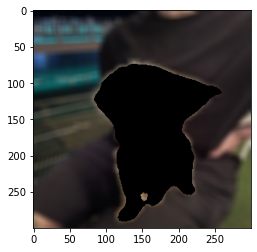

In [65]:
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
img_bg_mask = cv2.bitwise_not(img_mask_color)
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

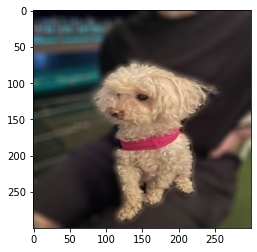

In [66]:
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

- 강아지는 잘 인식했으나, 배경의 사람인식이 조금 떨어진다.

## 인물 사진

(300, 400, 3)


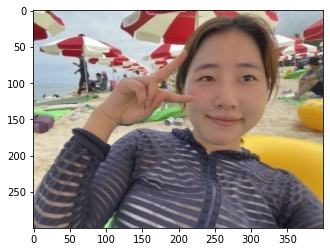

In [67]:
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/IMG_0605.JPG'  
img_orig = cv2.imread(img_path) 
img_orig = cv2.resize(img_orig, (400, 300), interpolation = cv2.INTER_AREA)
# 이미지 사이즈 변경
print(img_orig.shape)
cv2.imwrite(img_path,img_orig) # 사이즈 변경 후 img path에 저장 
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

In [68]:
model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models' 
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5') 
model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5' 
urllib.request.urlretrieve(model_url, model_file)

('/aiffel/aiffel/human_segmentation/models/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5',
 <http.client.HTTPMessage at 0x7f2eb17c7be0>)

In [69]:
model = semantic_segmentation()
model.load_pascalvoc_model(model_file)

In [70]:
segvalues, output = model.segmentAsPascalvoc(img_path) 

In [71]:
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
len(LABEL_NAMES)

21

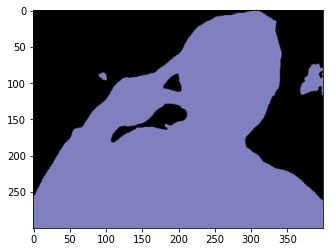

In [72]:
#output = cv2.flip(output, 0)
plt.imshow(output)
plt.show()

- 배경에 있는 사람들도 인식했다.

In [73]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
chair
person


In [74]:
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[15] 

array([192, 128, 128])

(300, 400)


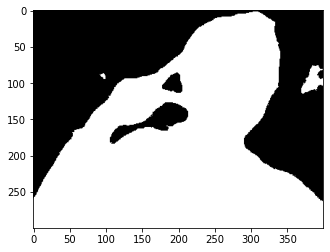

In [75]:
seg_color = (128,128, 192)
seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape) 
plt.imshow(seg_map, cmap='gray')
plt.show()

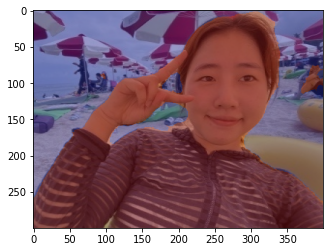

In [76]:
img_show = img_orig.copy()

img_mask = seg_map.astype(np.uint8) * 255
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

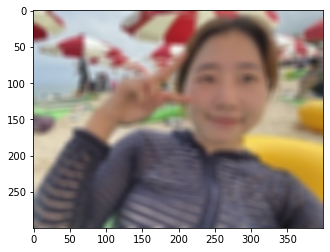

In [77]:
img_orig_blur = cv2.blur(img_orig, (10,10))
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

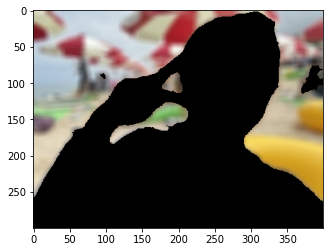

In [78]:
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
img_bg_mask = cv2.bitwise_not(img_mask_color)
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

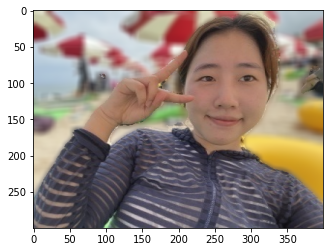

In [79]:
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

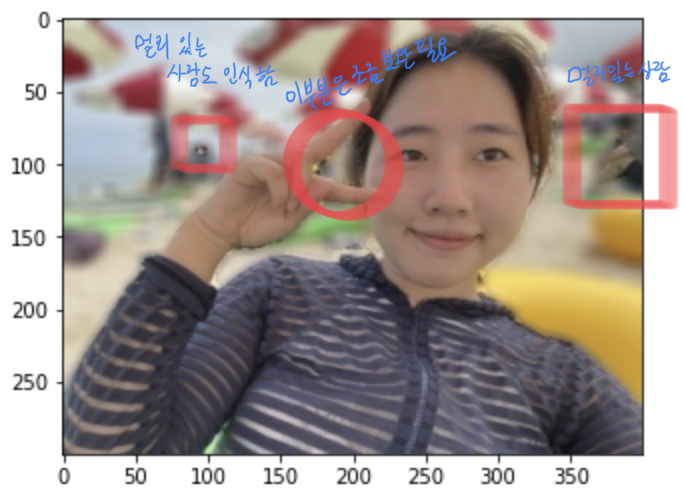

---

(300, 400, 3)


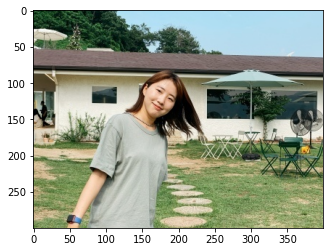

In [80]:
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/IMG_1075.JPG'  
img_orig = cv2.imread(img_path) 
img_orig = cv2.resize(img_orig, (400, 300), interpolation = cv2.INTER_AREA)
# 이미지 사이즈 변경
print(img_orig.shape)
cv2.imwrite(img_path,img_orig) # 사이즈 변경 후 img path에 저장 
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

In [81]:
model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models' 
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5') 
model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5' 
urllib.request.urlretrieve(model_url, model_file)

('/aiffel/aiffel/human_segmentation/models/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5',
 <http.client.HTTPMessage at 0x7f2ea74d0220>)

In [82]:
model = semantic_segmentation()
model.load_pascalvoc_model(model_file)

In [83]:
segvalues, output = model.segmentAsPascalvoc(img_path) 

In [84]:
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
len(LABEL_NAMES)

21

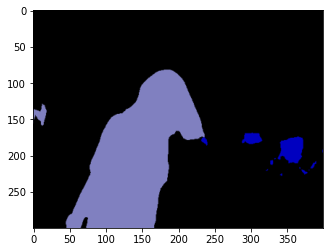

In [85]:
plt.imshow(output)
plt.show()

In [86]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
chair
person


In [87]:
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[15] 

array([192, 128, 128])

(300, 400)


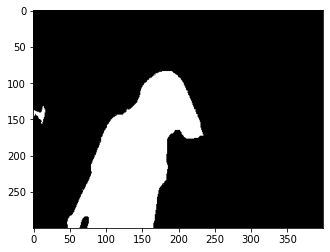

In [88]:
seg_color = (128,128, 192)
seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape) 
plt.imshow(seg_map, cmap='gray')
plt.show()

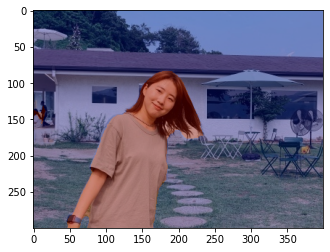

In [89]:
img_show = img_orig.copy()

img_mask = seg_map.astype(np.uint8) * 255
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

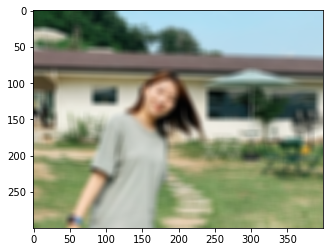

In [90]:
img_orig_blur = cv2.blur(img_orig, (10,10))
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

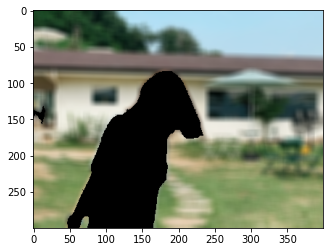

In [91]:
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
img_bg_mask = cv2.bitwise_not(img_mask_color)
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

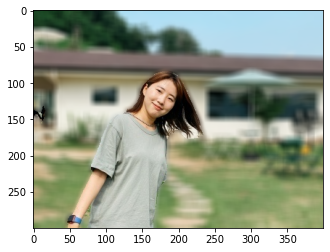

In [92]:
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

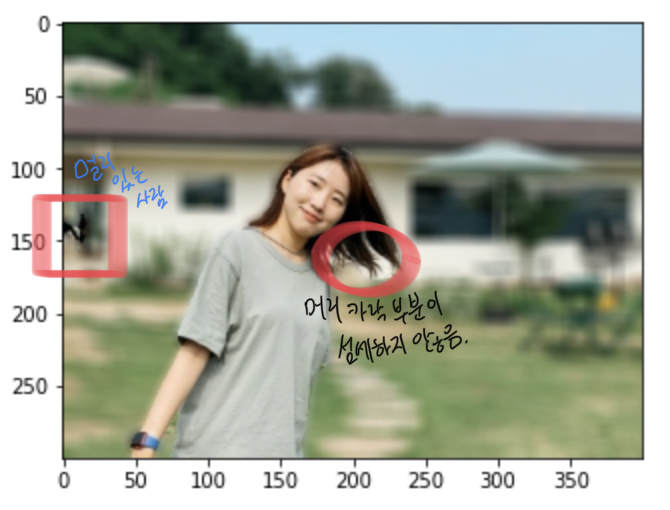

---

(300, 400, 3)


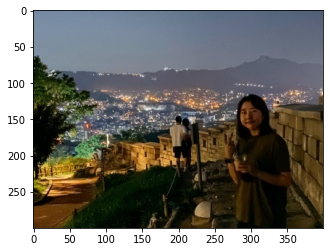

In [93]:
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/IMG_0952.JPG'  
img_orig = cv2.imread(img_path) 
img_orig = cv2.resize(img_orig, (400, 300), interpolation = cv2.INTER_AREA)
# 이미지 사이즈 변경
print(img_orig.shape)
cv2.imwrite(img_path,img_orig) # 사이즈 변경 후 img path에 저장 
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

In [94]:
model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models' 
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5') 
model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5' 
urllib.request.urlretrieve(model_url, model_file)

('/aiffel/aiffel/human_segmentation/models/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5',
 <http.client.HTTPMessage at 0x7f2ea4cc8880>)

In [95]:
model = semantic_segmentation()
model.load_pascalvoc_model(model_file)

In [96]:
segvalues, output = model.segmentAsPascalvoc(img_path) 

In [97]:
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
len(LABEL_NAMES)

21

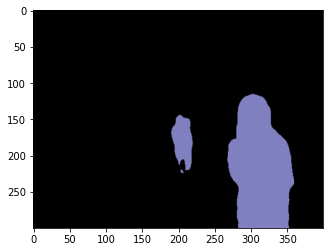

In [98]:
plt.imshow(output)
plt.show()

In [99]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
person


In [100]:
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[15] 

array([192, 128, 128])

(300, 400)


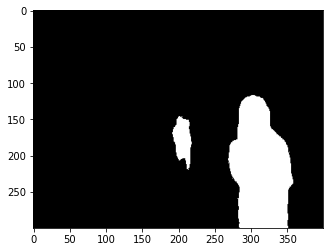

In [101]:
seg_color = (128,128, 192)
seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape) 
plt.imshow(seg_map, cmap='gray')
plt.show()

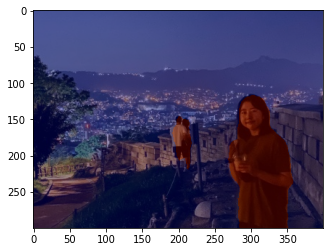

In [102]:
img_show = img_orig.copy()

img_mask = seg_map.astype(np.uint8) * 255
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

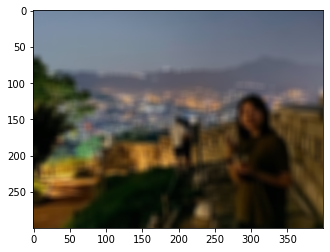

In [103]:
img_orig_blur = cv2.blur(img_orig, (10,10))
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

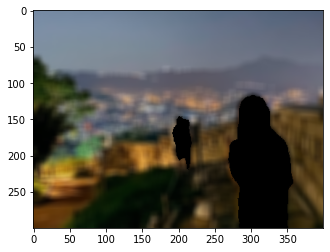

In [104]:
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
img_bg_mask = cv2.bitwise_not(img_mask_color)
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

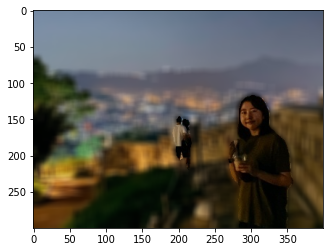

In [105]:
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

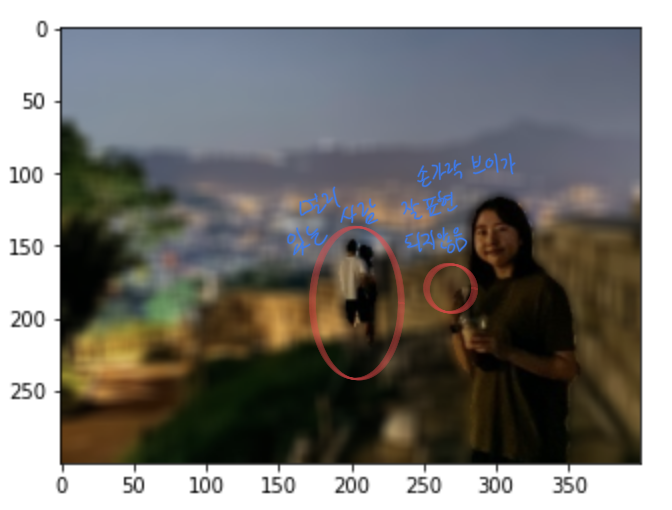

(300, 400, 3)


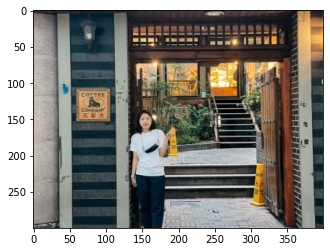

In [106]:
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/IMG_0882.JPG'  
img_orig = cv2.imread(img_path) 
img_orig = cv2.resize(img_orig, (400, 300), interpolation = cv2.INTER_AREA)
# 이미지 사이즈 변경
print(img_orig.shape)
cv2.imwrite(img_path,img_orig) # 사이즈 변경 후 img path에 저장 
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

In [107]:
model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models' 
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5') 
model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5' 
urllib.request.urlretrieve(model_url, model_file)

('/aiffel/aiffel/human_segmentation/models/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5',
 <http.client.HTTPMessage at 0x7f2ea7565400>)

In [108]:
model = semantic_segmentation()
model.load_pascalvoc_model(model_file)

In [109]:
segvalues, output = model.segmentAsPascalvoc(img_path) 

In [110]:
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
len(LABEL_NAMES)

21

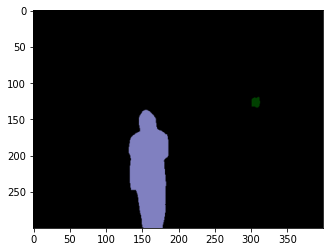

In [111]:
plt.imshow(output)
plt.show()

In [112]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
person
pottedplant


In [113]:
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[15] 

array([192, 128, 128])

(300, 400)


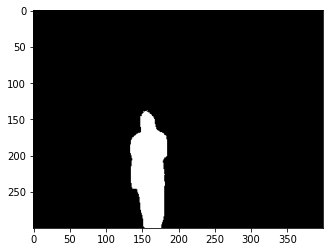

In [114]:
seg_color = (128,128, 192)
seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape) 
plt.imshow(seg_map, cmap='gray')
plt.show()

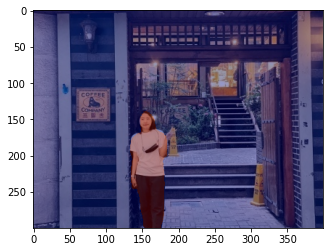

In [115]:
img_show = img_orig.copy()

img_mask = seg_map.astype(np.uint8) * 255
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

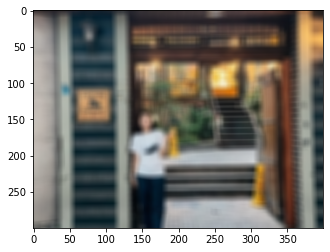

In [116]:
img_orig_blur = cv2.blur(img_orig, (10,10))
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

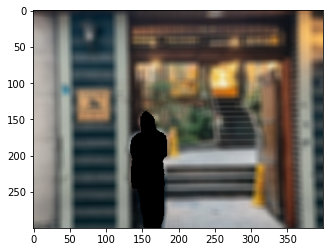

In [117]:
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
img_bg_mask = cv2.bitwise_not(img_mask_color)
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

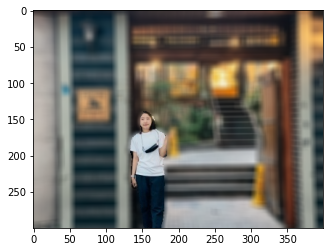

In [118]:
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

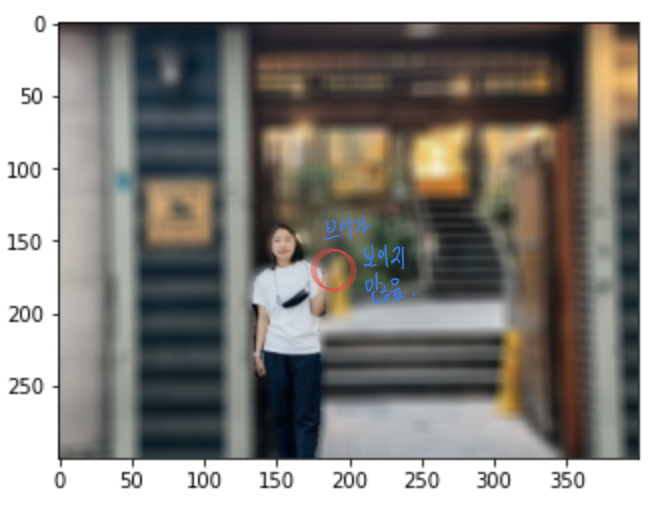

## 두 사람.

(300, 400, 3)


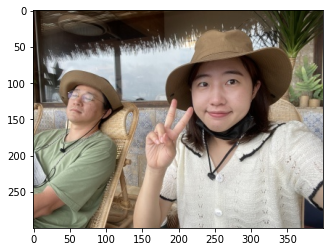

In [119]:
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/IMG_0616.JPG'  
img_orig = cv2.imread(img_path) 
img_orig = cv2.resize(img_orig, (400, 300), interpolation = cv2.INTER_AREA)
# 이미지 사이즈 변경
print(img_orig.shape)
cv2.imwrite(img_path,img_orig) # 사이즈 변경 후 img path에 저장 
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

In [120]:
model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models' 
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5') 
model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5' 
urllib.request.urlretrieve(model_url, model_file)

('/aiffel/aiffel/human_segmentation/models/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5',
 <http.client.HTTPMessage at 0x7f2ea60b60d0>)

In [121]:
model = semantic_segmentation()
model.load_pascalvoc_model(model_file)

In [122]:
segvalues, output = model.segmentAsPascalvoc(img_path) 

In [123]:
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
len(LABEL_NAMES)

21

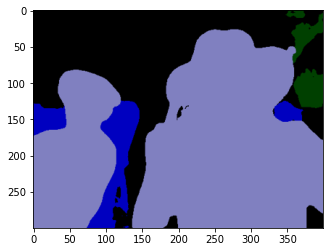

In [124]:
plt.imshow(output)
plt.show()

In [125]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
chair
person
pottedplant


In [126]:
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[15] 

array([192, 128, 128])

(300, 400)


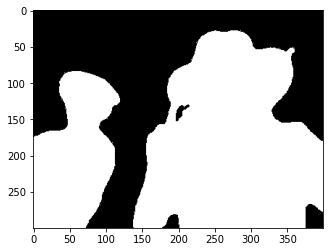

In [127]:
seg_color = (128,128, 192)
seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape) 
plt.imshow(seg_map, cmap='gray')
plt.show()

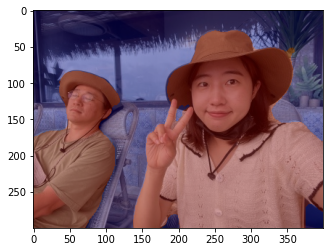

In [128]:
img_show = img_orig.copy()

img_mask = seg_map.astype(np.uint8) * 255
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

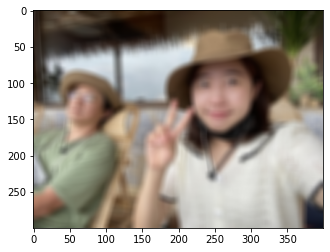

In [129]:
img_orig_blur = cv2.blur(img_orig, (10,10))
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

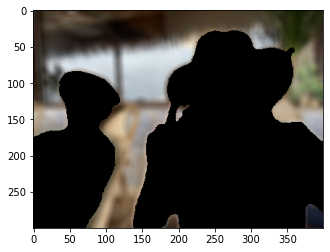

In [130]:
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
img_bg_mask = cv2.bitwise_not(img_mask_color)
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

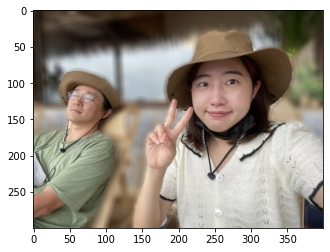

In [131]:
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

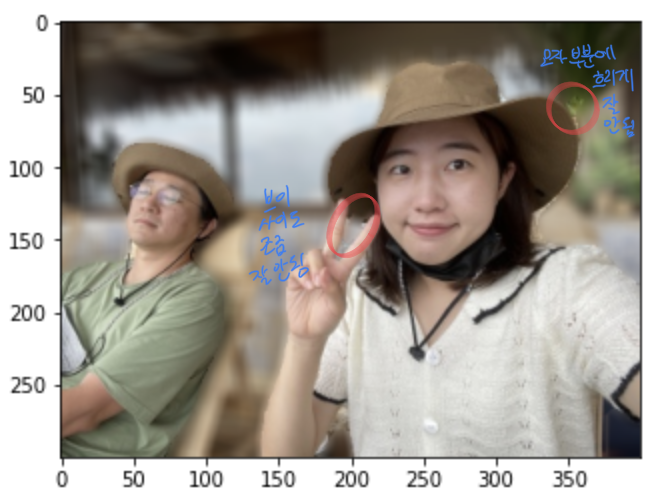

## 배경 바꿔보기

(300, 400, 3)


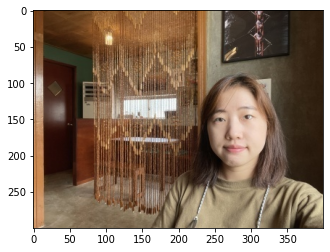

In [132]:
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/IMG_0436.JPG'  
img_orig = cv2.imread(img_path) 
img_orig = cv2.resize(img_orig, (400, 300), interpolation = cv2.INTER_AREA)
# 이미지 사이즈 변경
print(img_orig.shape)
cv2.imwrite(img_path,img_orig) # 사이즈 변경 후 img path에 저장 
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

(300, 400, 3)


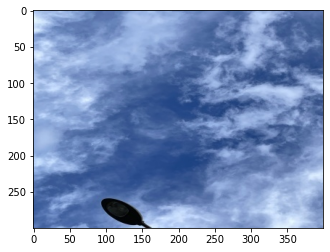

In [133]:
img_path2 = os.getenv('HOME')+'/aiffel/human_segmentation/images/IMG_1329.JPG'  
img_orig2 = cv2.imread(img_path2) 
img_orig2 = cv2.resize(img_orig2, (400, 300), interpolation = cv2.INTER_AREA)
# 이미지 사이즈 변경
print(img_orig2.shape)
cv2.imwrite(img_path2,img_orig2) # 사이즈 변경 후 img path에 저장 
plt.imshow(cv2.cvtColor(img_orig2, cv2.COLOR_BGR2RGB))
plt.show()

In [134]:
model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models' 
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5') 
model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5' 
urllib.request.urlretrieve(model_url, model_file)

('/aiffel/aiffel/human_segmentation/models/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5',
 <http.client.HTTPMessage at 0x7f2ea4bf8a60>)

In [135]:
model = semantic_segmentation()
model.load_pascalvoc_model(model_file)

In [136]:
segvalues, output = model.segmentAsPascalvoc(img_path) 

In [137]:
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
len(LABEL_NAMES)

21

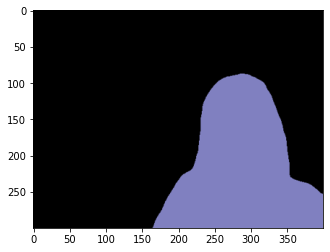

In [138]:
#output = cv2.flip(output, 0)
plt.imshow(output)
plt.show()

In [139]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
person


In [140]:
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[15] 

array([192, 128, 128])

(300, 400)


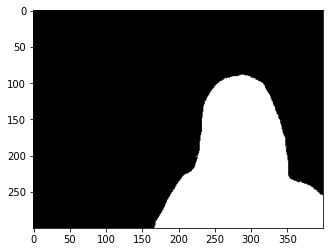

In [141]:
seg_color = (128,128, 192)
seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape) 
plt.imshow(seg_map, cmap='gray')
plt.show()

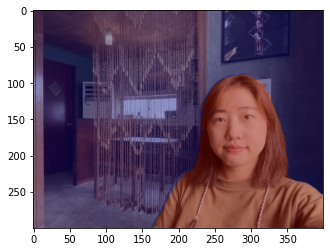

In [142]:
img_show = img_orig.copy()

img_mask = seg_map.astype(np.uint8) * 255
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

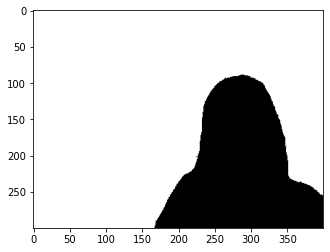

In [143]:
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
img_bg_mask = cv2.bitwise_not(img_mask_color)
plt.imshow(cv2.cvtColor(img_bg_mask, cv2.COLOR_BGR2RGB))  
plt.show()

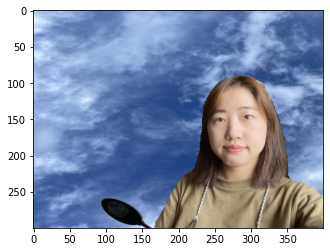

In [145]:
img_concat = np.where(img_mask_color==255, img_orig, img_orig2)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

- 배경을 바뀌는 것은 잘 되었다.

----
### 흐림 처리가 잘 안된 것을 보완하는 기술적인 방법
1. 사진을 찍을 때, 인물과 인물이 아닌 배경 부분이 보낸 신호가 되돌아 오는 시간을 각각 측정해, 짧은 시간이면 가까이 있는 인물이나 사물이 되므로, 배경가 쉽게 구분이 가능해 흐림 처리가 보완이 될 것 같다.
2. SLAM 과 같이 동시적으로 사진을 찍을 때, 인물의 공간 좌표를 배경과 구분되는 아웃라인으로 포인트르 잡아서 선명하게 흐림 처리를 할 수 있을 것 같다.

## 회고
- 어려웠던 점 : 인물과 동물을 동시에 선택해서 흐림 효과를 두는 점이 어려웠다.
- 알아낸 점 및 모호한 점 : 동물이 특이한 자세를 해도 인식을 잘 하는 것이 신기했다. 하지만 사람의 손가락부분에 오류가 날 수 있다는 것을 알았다.
- 노력한 점 : 여러 가지 보완 방법을 생각해보도록 노력했고, 배경전화도 해보았다.
- 자기다짐 : 여러 사람이 있을 때, 한 사람만 포커스를 잡아서 흐림 효과를 넣는 방법은 semantic segmentation mask 모델 말고 다른 것을 사용해야 하는건지, 궁금하고 더 찾아봐야겠다.